In [1]:
import pandas as pd
import numpy as np
pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import plotly.graph_objects as go
from scipy import signal
from scipy.fft import fft, fftfreq
from scipy.fft import rfft, rfftfreq
from scipy.fft import irfft
import scipy as sp
from sklearn import metrics
import plotly.express as px
from sklearn.preprocessing import RobustScaler
import tensorflow
from scipy import stats
from sklearn.preprocessing import OneHotEncoder
import tensorflow as tf
from tensorflow import keras
from tensorflow import keras
from tensorflow.keras import models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras import utils
from tensorflow.keras import optimizers
from keras.utils.vis_utils import plot_model
from sklearn.metrics import confusion_matrix

In [240]:
# Set random seed for reproducability
from numpy.random import seed
seed(1)

tensorflow.random.set_seed(2)

# Loading the Data

Data from Linear Accelerometer - application Phyphox:

In [96]:
data_train = pd.read_csv('train_data.csv',sep=';',  header=0)

data_train.head()

,Time (s),Linear Acceleration x (m/s^2),Linear Acceleration y (m/s^2),Linear Acceleration z (m/s^2),sec,Frequency (Hz),activity
0,0.147890,-0.706831,0.448505,0.602294,0,53,Walking
1,0.166546,-1.144112,0.515611,1.185168,0,53,Walking
2,0.185203,-1.223346,0.537570,1.421165,0,53,Walking
3,0.203859,-1.558452,0.570905,1.426826,0,53,Walking
4,0.222515,-1.816246,0.406578,1.481425,0,53,Walking


In [60]:
data_train.shape

(44149, 7)

In [61]:
data_train.describe()

,Time (s),Linear Acceleration x (m/s^2),Linear Acceleration y (m/s^2),Linear Acceleration z (m/s^2),sec,Frequency (Hz)
count,44149.000000,44149.000000,44149.000000,44149.000000,44149.000000,44149.0
mean,419.787110,-0.022750,0.147203,-0.283099,419.153661,53.0
std,241.580320,2.657064,2.076409,2.947248,241.580290,0.0
min,0.147890,-16.943813,-13.093399,-22.559547,0.000000,53.0
25%,211.388481,-0.753894,-0.503810,-1.419622,211.000000,53.0
50%,420.637516,-0.019160,0.049642,-0.036626,420.000000,53.0
75%,628.870778,0.673655,0.988889,1.054764,628.000000,53.0
max,837.116879,19.426918,10.246099,17.771767,836.000000,53.0


In [97]:
data_test = pd.read_csv('test_data.csv',sep=';',  header=0)
data_test.head()

,Time (s),Linear Acceleration x (m/s^2),Linear Acceleration y (m/s^2),Linear Acceleration z (m/s^2),sec,Frequency (Hz),activity
0,0.150664,-1.617969,1.634225,-2.645437,0,53,Walking
1,0.169347,-1.551534,2.010600,-1.960073,0,53,Walking
2,0.187977,-1.992367,1.989315,-1.802923,0,53,Walking
3,0.206634,-2.386743,2.261469,-1.769722,0,53,Walking
4,0.225291,-2.643509,2.382557,-1.340229,0,53,Walking


In [63]:
data_test.shape

(19769, 7)

In [64]:
data_test.describe()

,Time (s),Linear Acceleration x (m/s^2),Linear Acceleration y (m/s^2),Linear Acceleration z (m/s^2),sec,Frequency (Hz)
count,19769.000000,19769.000000,19769.000000,19769.000000,19769.000000,19769.0
mean,186.636407,-0.047900,0.145623,-0.201141,186.000000,53.0
std,107.678058,2.279933,2.269128,3.213464,107.678162,0.0
min,0.150664,-20.048805,-13.278999,-26.844561,0.000000,53.0
25%,93.386192,-0.757574,-0.453721,-0.989581,93.000000,53.0
50%,186.642523,-0.058919,0.017632,-0.011195,186.000000,53.0
75%,279.874345,0.523952,0.743296,0.840186,279.000000,53.0
max,373.124032,13.227944,18.239582,23.389143,372.000000,53.0


# Data visualization

In [65]:
train = data_train.set_index('Time (s)')
test = data_test.set_index('Time (s)')

array([<AxesSubplot:xlabel='Time (s)'>, <AxesSubplot:xlabel='Time (s)'>,
       <AxesSubplot:xlabel='Time (s)'>], dtype=object)

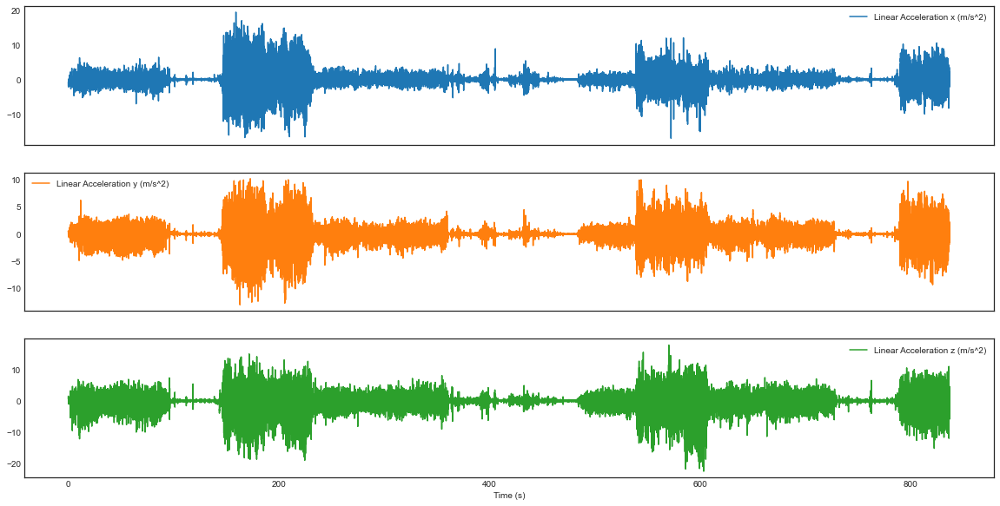

In [67]:
train[['Linear Acceleration x (m/s^2)', 'Linear Acceleration y (m/s^2)', 'Linear Acceleration z (m/s^2)']].plot(subplots=True, figsize=(20,10))

array([<AxesSubplot:xlabel='Time (s)'>, <AxesSubplot:xlabel='Time (s)'>,
       <AxesSubplot:xlabel='Time (s)'>], dtype=object)

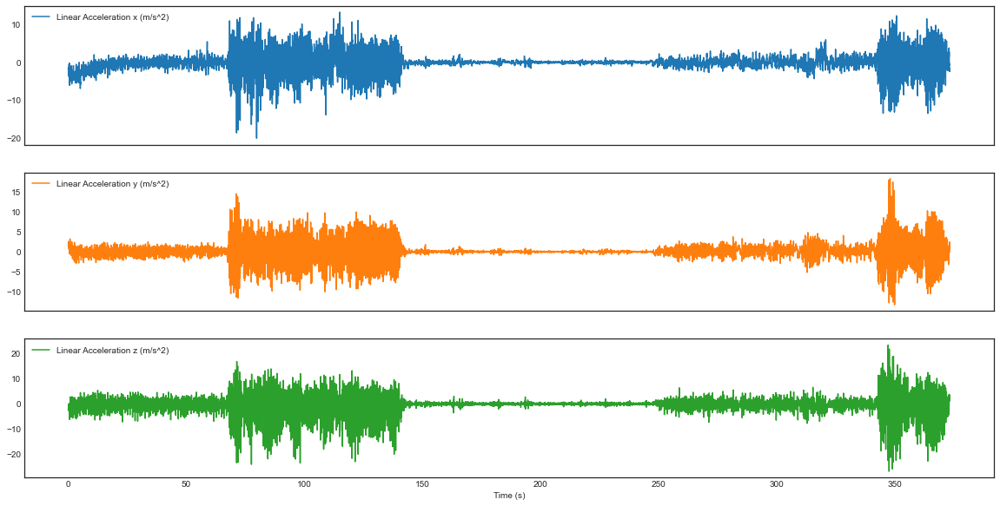

In [68]:
test[['Linear Acceleration x (m/s^2)', 'Linear Acceleration y (m/s^2)', 'Linear Acceleration z (m/s^2)']].plot(subplots=True, figsize=(20,10))

In [15]:
def fig_from_df(df):
    fig = go.Figure()
    for col in df.columns:
        fig.add_trace(go.Scatter(x=df.index,y=df[col],name=col))
        
    fig.update_layout(
    title="Train data from accelerometer",
    xaxis_title="Time (sec)")
    return fig

In [69]:
fig = fig_from_df(train[['Linear Acceleration x (m/s^2)', 'Linear Acceleration y (m/s^2)', 'Linear Acceleration z (m/s^2)']])
#fig.write_html('Accelerometer_train.html',full_html=False,include_plotlyjs='cdn')
fig.show()

In [70]:
def fig_from_df(df):
    fig = go.Figure()
    for col in df.columns:
        fig.add_trace(go.Scatter(x=df.index,y=df[col],name=col))
        
    fig.update_layout(
    title="Test data from accelerometer",
    xaxis_title="Time (sec)")
    return fig

fig = fig_from_df(test[['Linear Acceleration x (m/s^2)', 'Linear Acceleration y (m/s^2)', 'Linear Acceleration z (m/s^2)']])
#fig.write_html('Accelerometer_test.html',full_html=False,include_plotlyjs='cdn')
fig.show()

# Handling outliers

Text(0.5, 1.0, 'Linear Acceleration z (m/s^2)')

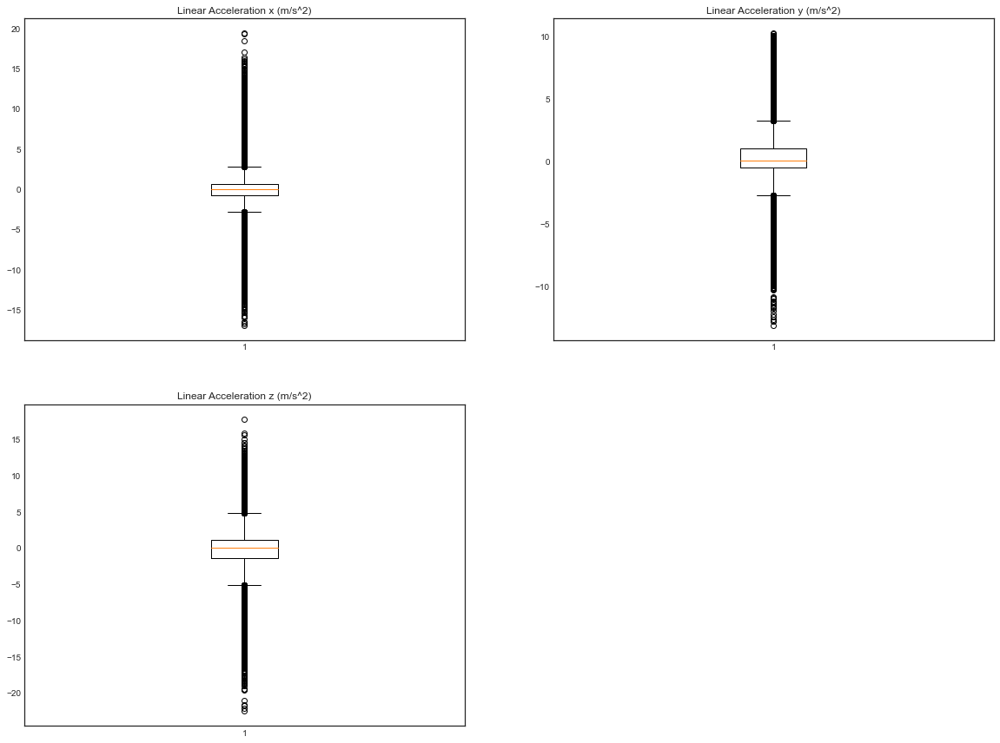

In [18]:
#train
plt.figure(figsize = (20, 15))
plt.style.use('seaborn-white')
ax=plt.subplot(221)
plt.boxplot(train['Linear Acceleration x (m/s^2)'])
ax.set_title('Linear Acceleration x (m/s^2)')
ax=plt.subplot(222)
plt.boxplot(train['Linear Acceleration y (m/s^2)'])
ax.set_title('Linear Acceleration y (m/s^2)')
ax=plt.subplot(223)
plt.boxplot(train['Linear Acceleration z (m/s^2)'])
ax.set_title('Linear Acceleration z (m/s^2)')


Text(0.5, 1.0, 'Linear Acceleration z (m/s^2)')

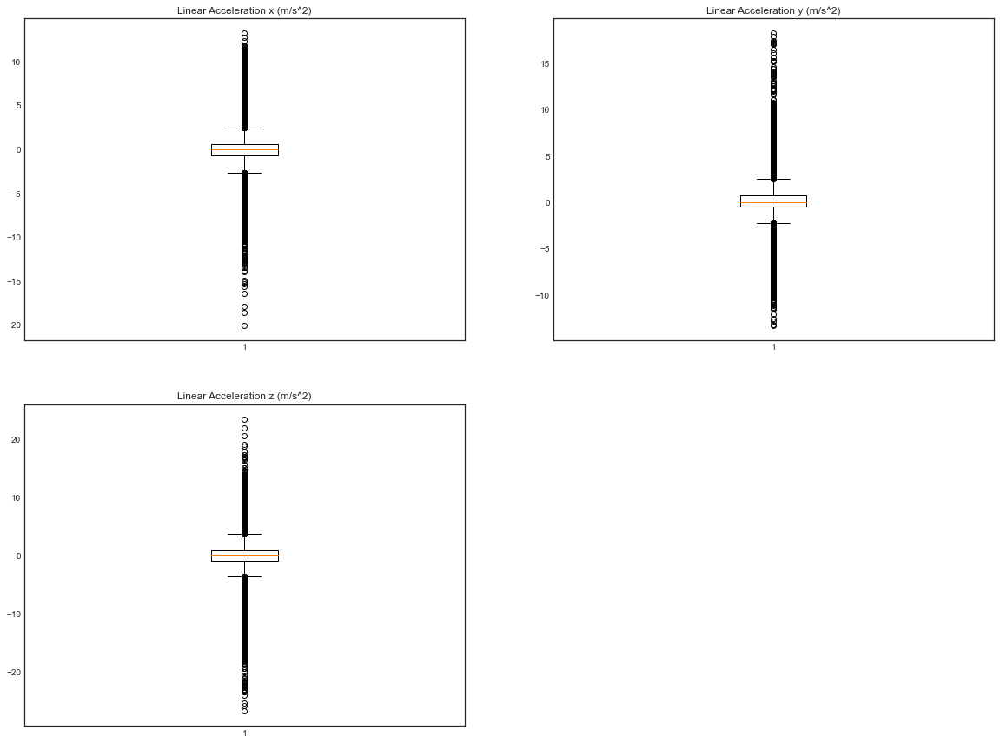

In [19]:
#test
plt.figure(figsize = (20, 15))
plt.style.use('seaborn-white')
ax=plt.subplot(221)
plt.boxplot(test['Linear Acceleration x (m/s^2)'])
ax.set_title('Linear Acceleration x (m/s^2)')
ax=plt.subplot(222)
plt.boxplot(test['Linear Acceleration y (m/s^2)'])
ax.set_title('Linear Acceleration y (m/s^2)')
ax=plt.subplot(223)
plt.boxplot(test['Linear Acceleration z (m/s^2)'])
ax.set_title('Linear Acceleration z (m/s^2)')

In [71]:
fig_acc_X = px.scatter(x=data_train['Time (s)'],
                y=data_train['Linear Acceleration x (m/s^2)'],
                color=data_train["activity"],)\
                .update_layout(
                                title="Train data from Linear Acceleration x (m/s^2)",
                                xaxis_title="Time (sec)",
                                yaxis_title="acc_X",
                                template='plotly')
fig_acc_X.show()
#fig_acc_X.write_html('type_act_x_train.html',full_html=False,include_plotlyjs='cdn')

In [72]:
fig_acc_X = px.scatter(x=data_test['Time (s)'],
                y=data_test['Linear Acceleration x (m/s^2)'],
                color=data_test["activity"],)\
                .update_layout(
                                title="Test data from Linear Acceleration x (m/s^2)",
                                xaxis_title="Time (sec)",
                                yaxis_title="acc_X",
                                template='plotly')
fig_acc_X.show()
#fig_acc_X.write_html('type_act_x_test.html',full_html=False,include_plotlyjs='cdn')

# Сorrelation

In [73]:
num_cols = ['Linear Acceleration x (m/s^2)', 'Linear Acceleration y (m/s^2)', 'Linear Acceleration z (m/s^2)']

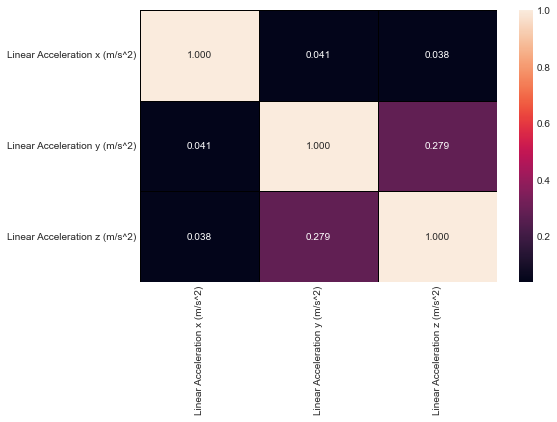

In [74]:
f,ax=plt.subplots(figsize=(8,5))
sns.heatmap(data_train[num_cols].corr(),annot=True,linewidths=0.5,linecolor="black",fmt=".3f",ax=ax)
plt.show()

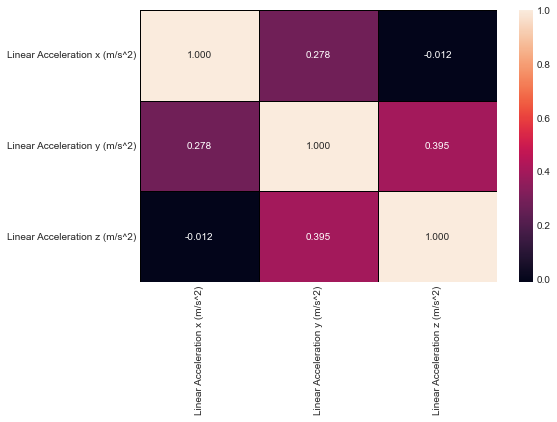

In [75]:
f,ax=plt.subplots(figsize=(8,5))
sns.heatmap(data_train[data_train['activity'] == 'Walking'][num_cols].corr(),annot=True,linewidths=0.5,linecolor="black",fmt=".3f",ax=ax)
plt.show()

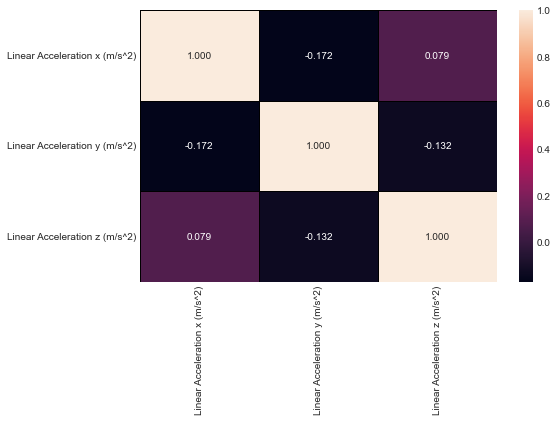

In [76]:
f,ax=plt.subplots(figsize=(8,5))
sns.heatmap(data_train[data_train['activity'] == 'Rest'][num_cols].corr(),annot=True,linewidths=0.5,linecolor="black",fmt=".3f",ax=ax)
plt.show()

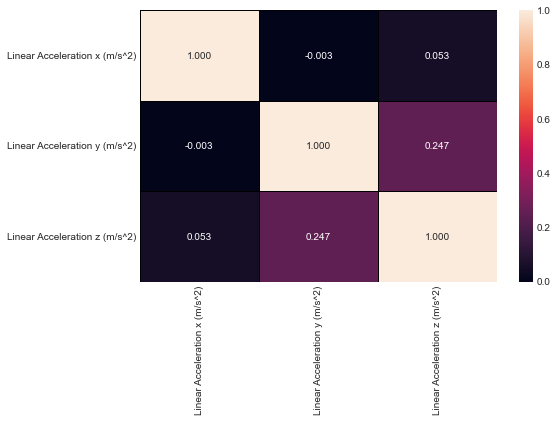

In [77]:
f,ax=plt.subplots(figsize=(8,5))
sns.heatmap(data_train[data_train['activity'] == 'Running'][num_cols].corr(),annot=True,linewidths=0.5,linecolor="black",fmt=".3f",ax=ax)
plt.show()

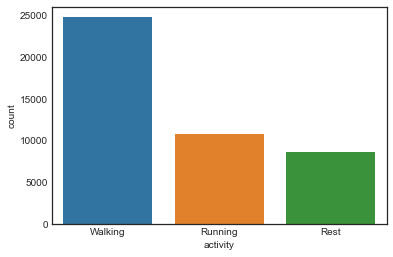

In [78]:
sns.countplot(x = 'activity',
              data = data_train,
              order = data_train.activity.value_counts().index);

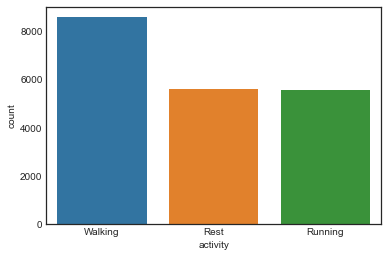

In [80]:
sns.countplot(x = 'activity',
              data = data_test,
              order = data_test.activity.value_counts().index);

In [81]:
data_train.head(1)

,Time (s),Linear Acceleration x (m/s^2),Linear Acceleration y (m/s^2),Linear Acceleration z (m/s^2),sec,Frequency (Hz),activity
0,0.14789,-0.706831,0.448505,0.602294,0,53,Walking


In [82]:
data_train_abs = data_train
data_train_abs['Linear Acceleration x (m/s^2)'] = data_train_abs['Linear Acceleration x (m/s^2)'].abs()
data_train_abs['Linear Acceleration y (m/s^2)'] = data_train_abs['Linear Acceleration y (m/s^2)'].abs()
data_train_abs['Linear Acceleration z (m/s^2)'] = data_train_abs['Linear Acceleration z (m/s^2)'].abs()
data_train_abs.head()

,Time (s),Linear Acceleration x (m/s^2),Linear Acceleration y (m/s^2),Linear Acceleration z (m/s^2),sec,Frequency (Hz),activity
0,0.147890,0.706831,0.448505,0.602294,0,53,Walking
1,0.166546,1.144112,0.515611,1.185168,0,53,Walking
2,0.185203,1.223346,0.537570,1.421165,0,53,Walking
3,0.203859,1.558452,0.570905,1.426826,0,53,Walking
4,0.222515,1.816246,0.406578,1.481425,0,53,Walking


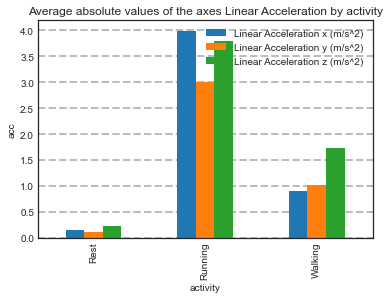

In [83]:
data_train_abs.groupby('activity')['Linear Acceleration x (m/s^2)', 'Linear Acceleration y (m/s^2)', 'Linear Acceleration z (m/s^2)'].mean().plot(kind='bar')  
plt.title('Average absolute values of the axes Linear Acceleration by activity')
plt.xlabel('activity')
plt.ylabel('acc') 
plt.grid(color='#95a5a6', linestyle='--', linewidth=2, axis='y', alpha=0.7)
plt.show();

# Classification for Human Activity Recognition with LSTMs

In [98]:
features = ['Linear Acceleration x (m/s^2)', 'Linear Acceleration y (m/s^2)', 'Linear Acceleration z (m/s^2)']
label = 'activity'

In [99]:
data_train.shape, data_test.shape

((44149, 7), (19769, 7))

In [100]:
train = data_train.copy()
test = data_test.copy()

Scaling variables using RobustScaler (outlier resistant):

In [101]:
scaler = RobustScaler()

scaler = scaler.fit(train[features].values)

In [102]:
train[features] = scaler.transform(train[features].to_numpy())
test[features] = scaler.transform(test[features].to_numpy())
train.head()

,Time (s),Linear Acceleration x (m/s^2),Linear Acceleration y (m/s^2),Linear Acceleration z (m/s^2),sec,Frequency (Hz),activity
0,0.147890,-0.481715,0.267209,0.258213,0,53,Walking
1,0.166546,-0.788030,0.312165,0.493777,0,53,Walking
2,0.185203,-0.843534,0.326876,0.589153,0,53,Walking
3,0.203859,-1.078276,0.349208,0.591441,0,53,Walking
4,0.222515,-1.258861,0.239121,0.613506,0,53,Walking


The sensor data was recorded at a frequency of 53 Hz, which means 53 observations per second. Since I want to generate a prediction about every 2 seconds, I train the model with a prediction window of 106. This means that the model uses 106 observations to classify the type of activity.

STEP_DISTANCE = 10 (9.4% overlap).

In [233]:
def create_dataset(X, y, time_steps=1, step=1):
    Xs, ys = [], []
    for i in range(0, len(X) - time_steps, step):
        v = X.iloc[i:(i + time_steps)].values
        labels = y.iloc[i: i + time_steps]
        Xs.append(v)        
        ys.append(stats.mode(labels)[0][0])
    return np.array(Xs), np.array(ys).reshape(-1, 1)

TIME_STEPS = 106
STEP = 10

X_train, y_train = create_dataset(
    train[['Linear Acceleration x (m/s^2)', 'Linear Acceleration y (m/s^2)', 'Linear Acceleration z (m/s^2)']], 
    train.activity, 
    TIME_STEPS, 
    STEP
)

X_test, y_test = create_dataset(
    test[['Linear Acceleration x (m/s^2)', 'Linear Acceleration y (m/s^2)', 'Linear Acceleration z (m/s^2)']], 
    test.activity, 
    TIME_STEPS, 
    STEP
)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((4405, 106, 3), (4405, 1), (1967, 106, 3), (1967, 1))

In [234]:
enc = OneHotEncoder(handle_unknown='ignore', sparse=False)

enc = enc.fit(y_train)

y_train = enc.transform(y_train)
y_test = enc.transform(y_test)

In [248]:
model_LSTM = keras.Sequential()
model_LSTM.add(
    keras.layers.Bidirectional(
      keras.layers.LSTM(
          units=8, 
          input_shape=[X_train.shape[1], X_train.shape[2]]
      )
    )
)
model_LSTM.add(keras.layers.Dropout(rate=0.5))
model_LSTM.add(keras.layers.Dense(units=8, activation='relu'))
model_LSTM.add(keras.layers.Dense(y_train.shape[1], activation='softmax'))
model_LSTM.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])

In [249]:
history = model_LSTM.fit(
    X_train, y_train,
    epochs=20,
    batch_size=24,
    validation_data=(X_test, y_test),
    shuffle=True)

Epoch 1/20
184/184 [==============================] - 24s 72ms/step - loss: 0.8793 - acc: 0.5705 - val_loss: 0.6357 - val_acc: 0.6411
Epoch 2/20
184/184 [==============================] - 11s 61ms/step - loss: 0.5882 - acc: 0.7469 - val_loss: 0.5461 - val_acc: 0.8155
Epoch 3/20
184/184 [==============================] - 8s 43ms/step - loss: 0.4395 - acc: 0.8615 - val_loss: 0.3375 - val_acc: 0.9059
Epoch 4/20
184/184 [==============================] - 8s 43ms/step - loss: 0.3216 - acc: 0.9006 - val_loss: 0.3035 - val_acc: 0.9171
Epoch 5/20
184/184 [==============================] - 8s 42ms/step - loss: 0.3254 - acc: 0.8944 - val_loss: 0.4552 - val_acc: 0.8815
Epoch 6/20
184/184 [==============================] - 8s 42ms/step - loss: 0.2802 - acc: 0.8972 - val_loss: 0.2146 - val_acc: 0.9349
Epoch 7/20
184/184 [==============================] - 8s 43ms/step - loss: 0.2103 - acc: 0.9319 - val_loss: 0.2663 - val_acc: 0.9222
Epoch 8/20
184/184 [==============================] - 8s 43ms/step 

In [202]:
# evaluate the LSTM model 
_, accuracy = model_LSTM.evaluate(X_test, y_test)
print('Accuracy: %.2f' % (accuracy*100))

62/62 [==============================] - 2s 8ms/step - loss: 0.2412 - acc: 0.9217
Accuracy: 92.17


In [250]:
# evaluate the LSTM model 
_, accuracy = model_LSTM.evaluate(X_test, y_test)
print('Accuracy: %.2f' % (accuracy*100))

62/62 [==============================] - 2s 8ms/step - loss: 0.3033 - acc: 0.9181
Accuracy: 91.81


In [203]:
print(model_LSTM.summary())

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_22 (Bidirecti  (None, 16)               768       
 onal)                                                           
                                                                 
 dropout_22 (Dropout)        (None, 16)                0         
                                                                 
 dense_44 (Dense)            (None, 8)                 136       
                                                                 
 dense_45 (Dense)            (None, 3)                 27        
                                                                 
Total params: 931
Trainable params: 931
Non-trainable params: 0
_________________________________________________________________
None


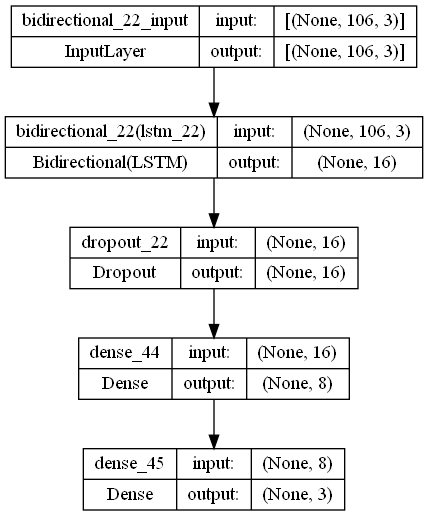

In [204]:
plot_model(model_LSTM, to_file='model_LSTM_plot.png', show_shapes=True, show_layer_names=True)

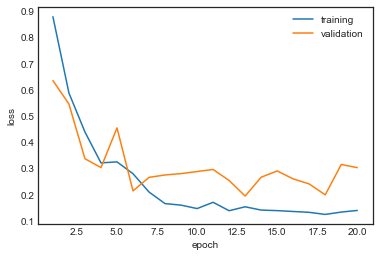

In [251]:
num_epochs = 20
epoch_nums = range(1,num_epochs+1)
training_loss = history.history["loss"]
validation_loss = history.history["val_loss"]
plt.plot(epoch_nums, training_loss)
plt.plot(epoch_nums, validation_loss)
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['training', 'validation'], loc='upper right')
plt.show()

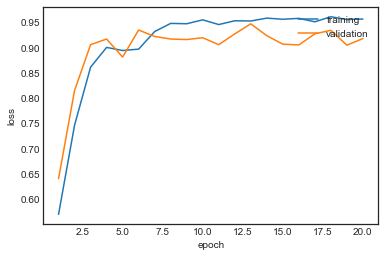

In [252]:
num_epochs = 20
epoch_nums = range(1,num_epochs+1)
training_loss = history.history["acc"]
validation_loss = history.history["val_acc"]
plt.plot(epoch_nums, training_loss)
plt.plot(epoch_nums, validation_loss)
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['training', 'validation'], loc='upper right')
plt.show()

In [253]:
y_pred = model_LSTM.predict(X_test)
y_true =  enc.inverse_transform(y_test)
prediction_LSTM = enc.inverse_transform(y_pred)

62/62 [==============================] - 6s 9ms/step


In [254]:
def plot_cm(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(8, 8)) 
    ax = sns.heatmap(
      cm, 
      annot=True, 
      fmt="d", 
      cmap=sns.diverging_palette(220, 20, n=7),
      ax=ax
  )
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    ax.set_xticklabels(class_names)
    ax.set_yticklabels(class_names)
    b, t = plt.ylim() 
    b += 0.5 
    t -= 0.5 
    plt.ylim(b, t) 
    plt.show() 

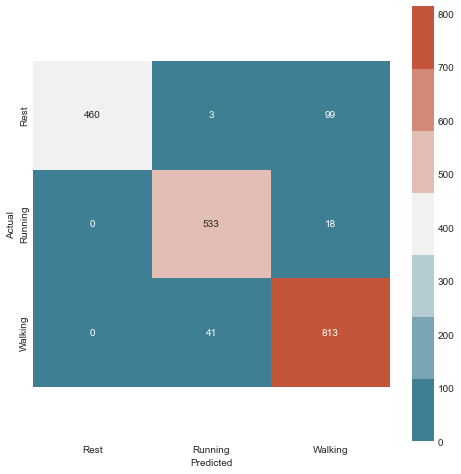

In [255]:
plot_cm(
  y_true,
  prediction_LSTM,
  enc.categories_[0]
)

In [256]:
arr = scaler.inverse_transform(X_test[:, 0, :])
arr

array([[-1.61796928,  1.63422489, -2.64543676],
       [-1.79666674,  1.4905262 , -1.02013588],
       [-2.24514246,  0.88181591, -1.73671198],
       ...,
       [-1.3219924 ,  2.34670496, -1.85401344],
       [ 1.98768234, -0.1113162 ,  5.66506958],
       [ 0.65859455,  0.30283356,  2.88229322]])

In [257]:
result_LSTM  = pd.DataFrame(arr, columns=['x_axis', 'y_axis', 'z_axis'])
result_LSTM.head()

,x_axis,y_axis,z_axis
0,-1.617969,1.634225,-2.645437
1,-1.796667,1.490526,-1.020136
2,-2.245142,0.881816,-1.736712
3,-4.460635,0.348515,-5.282110
4,-3.874481,3.180112,-1.849291


In [258]:
result_LSTM['predict_LSTM_activity'] = prediction_LSTM[:, 0]
result_LSTM['true_activity'] = y_true[:, 0]

result_LSTM.head()

,x_axis,y_axis,z_axis,predict_LSTM_activity,true_activity
0,-1.617969,1.634225,-2.645437,Running,Walking
1,-1.796667,1.490526,-1.020136,Running,Walking
2,-2.245142,0.881816,-1.736712,Running,Walking
3,-4.460635,0.348515,-5.282110,Running,Walking
4,-3.874481,3.180112,-1.849291,Running,Walking


In [259]:
result_LSTM

,x_axis,y_axis,z_axis,predict_LSTM_activity,true_activity
0,-1.617969,1.634225,-2.645437,Running,Walking
1,-1.796667,1.490526,-1.020136,Running,Walking
2,-2.245142,0.881816,-1.736712,Running,Walking
3,-4.460635,0.348515,-5.282110,Running,Walking
4,-3.874481,3.180112,-1.849291,Running,Walking
...,...,...,...,...,...
1962,4.020746,2.425818,-0.622511,Walking,Running
1963,1.612963,-0.108472,-3.258553,Walking,Running
1964,-1.321992,2.346705,-1.854013,Walking,Running
1965,1.987682,-0.111316,5.665070,Walking,Running


In [260]:
fig_acc = px.scatter(x=result_LSTM.index,
                y=result_LSTM['x_axis'],
                color=result_LSTM["true_activity"],)\
                .update_layout(
                                title="Test data from accelerometer, acc_X",
                                xaxis_title="Time (sec)",
                                yaxis_title="acc_X",
                                template='plotly')
fig_acc.show()

In [261]:
fig_acc = px.scatter(x=result_LSTM.index,
                y=result_LSTM['x_axis'],
                color=result_LSTM["predict_LSTM_activity"],)\
                .update_layout(
                                title="Test data from accelerometer, acc_X, predicted activity LSTM",
                                xaxis_title="Time (sec)",
                                yaxis_title="acc_X",
                                template='plotly')
fig_acc.show()